In [1]:
import pydeseq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

import scanpy as sc
import scanpy.external as sce
from scipy.sparse import csr_matrix
import harmonypy as hm
import sklearn
import numpy as np
import pandas as pd
import statsmodels as stat
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import gseapy as gp
import os
import tarfile
import glob
import GEOparse
import urllib.request
import io

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
# Configure Scanpy settings, enabling Parallel Processing

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=120, facecolor="white", frameon=True, figsize=(6, 5))
os.environ["OMP_NUM_THREADS"] = "4"
sc.settings.n_jobs = 4

In [3]:
# Loading data

adata = sc.read_h5ad("../Data/GSE111893/GSE111893_raw.h5ad")

In [4]:
# QC & Preprocessing

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

# sc.pp.filter_cells(adata, min_genes=200)
# sc.pp.filter_genes(adata, min_cells=3)
# if adata.var["mt"].sum() > 0:
#     adata = adata[adata.obs["pct_counts_mt"] < 20, :].copy()

# adata = adata[adata.obs["total_counts"] > 0, :].copy()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


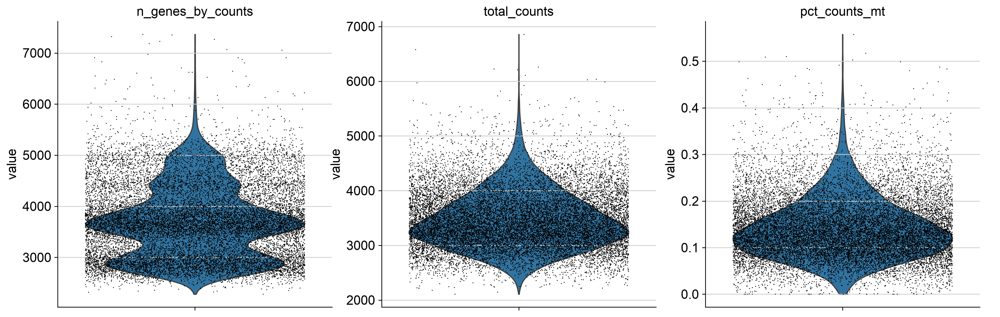

In [5]:
# QC Violin Plot

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

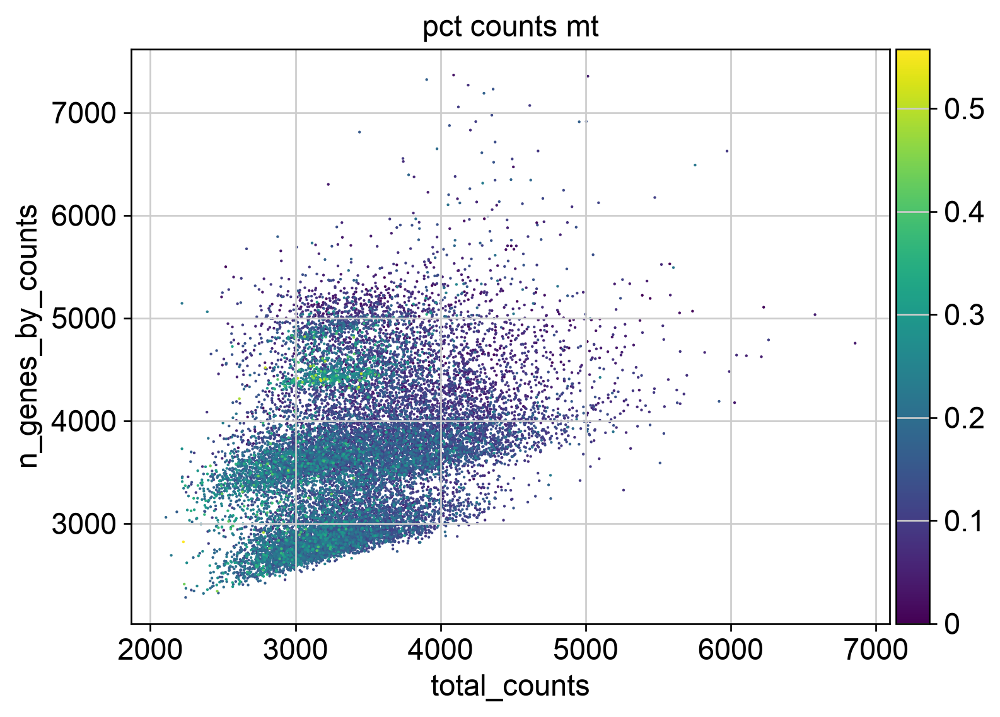

In [6]:
# QC Scatter

sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

Data seems to be preprocessed and adjusted. Normalization and filtering is not necessary.\
Cell with lowest gene counts is already >2000 which is above the 100 gene threshold. \
Filtering by genes would get rid of important genes that authors already ID'd as important. \
Doublets are already filtered out so skipping straight to HVG selection.

extracting highly variable genes


/Users/alexchen/anaconda3/envs/jmml_transcriptomics/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


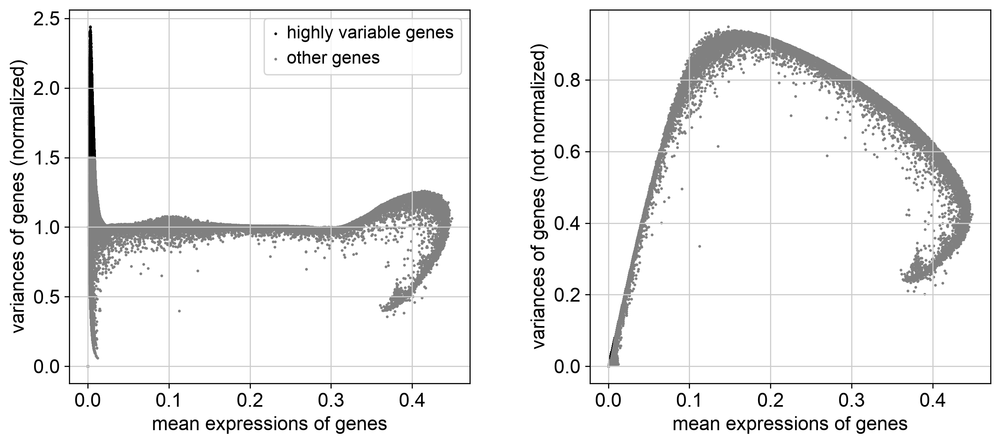

In [7]:
# HVG Selection

sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat_v3", layer=None)
sc.pl.highly_variable_genes(adata)

computing PCA
    with n_comps=50
    finished (0:00:07)


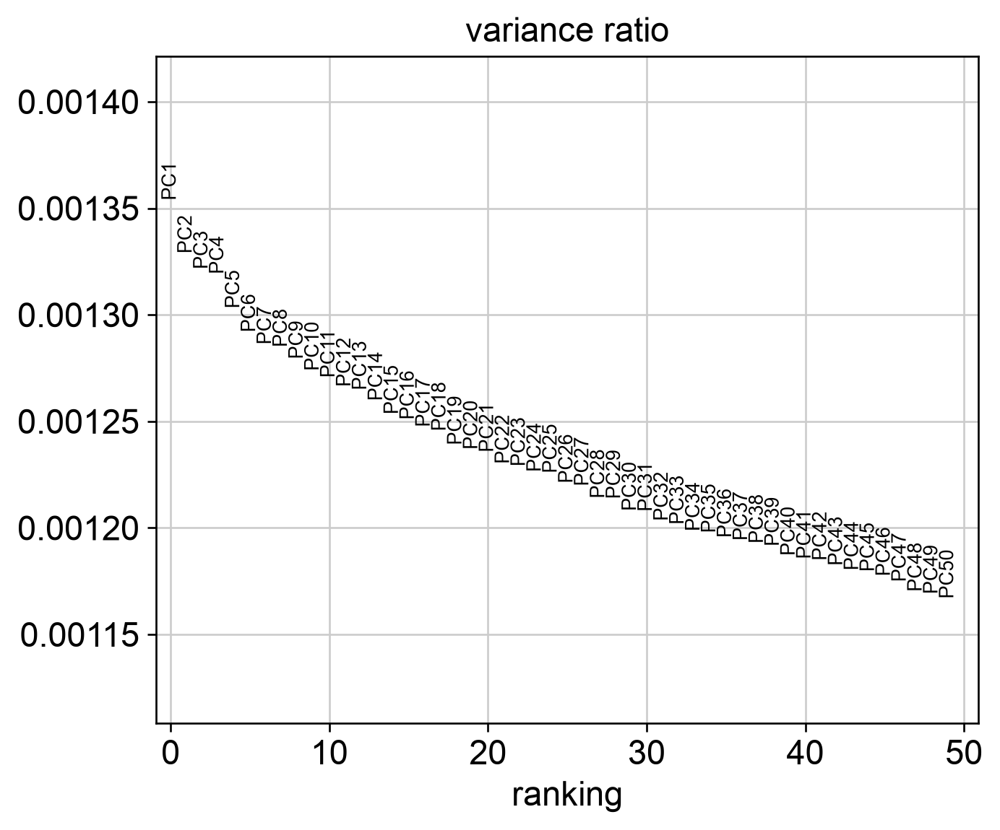

In [8]:
# 1. Compute 50 PCs (standard for 17k cells)
sc.tl.pca(adata, n_comps=50)

# 2. Plot variance ratios across all 50 PCs
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=False)

In [9]:
# Calculate basic QC metrics (adds 'total_counts' and 'n_genes_by_counts' to .obs)
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [10]:
# Select top 2,000 HVGs using seurat_v3
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3")

# Subset HVGs
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

# Scale expression values
sc.pp.scale(adata_hvg, max_value=10)

# Re-run PCA
sc.tl.pca(adata_hvg, n_comps=50)

extracting highly variable genes


/Users/alexchen/anaconda3/envs/jmml_transcriptomics/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/Users/alexchen/anaconda3/envs/jmml_transcriptomics/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:29)


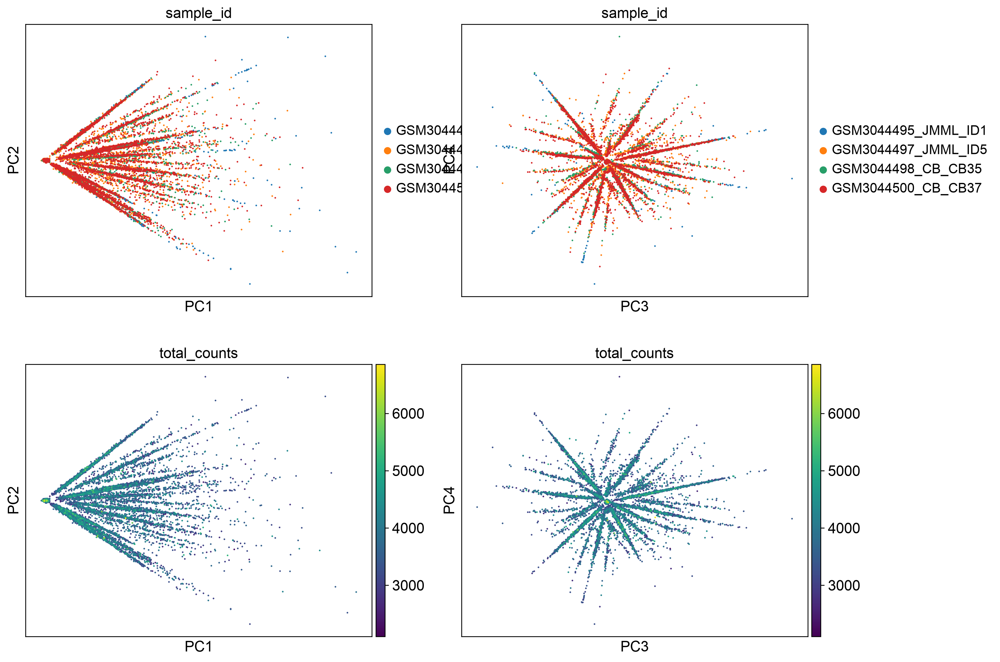

In [11]:
sc.pl.pca(
    adata_hvg,
    color=["sample_id", "sample_id", "total_counts", "total_counts"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=10,
)

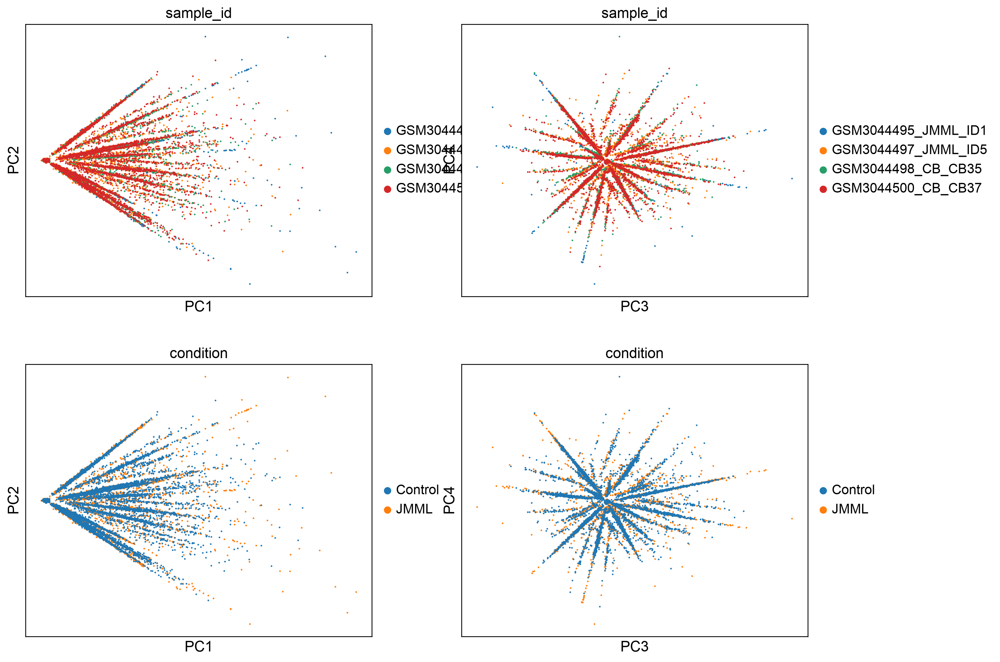

In [12]:
sc.pl.pca(
    adata_hvg,
    color=["sample_id", "sample_id", "condition", "condition"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=10,
)

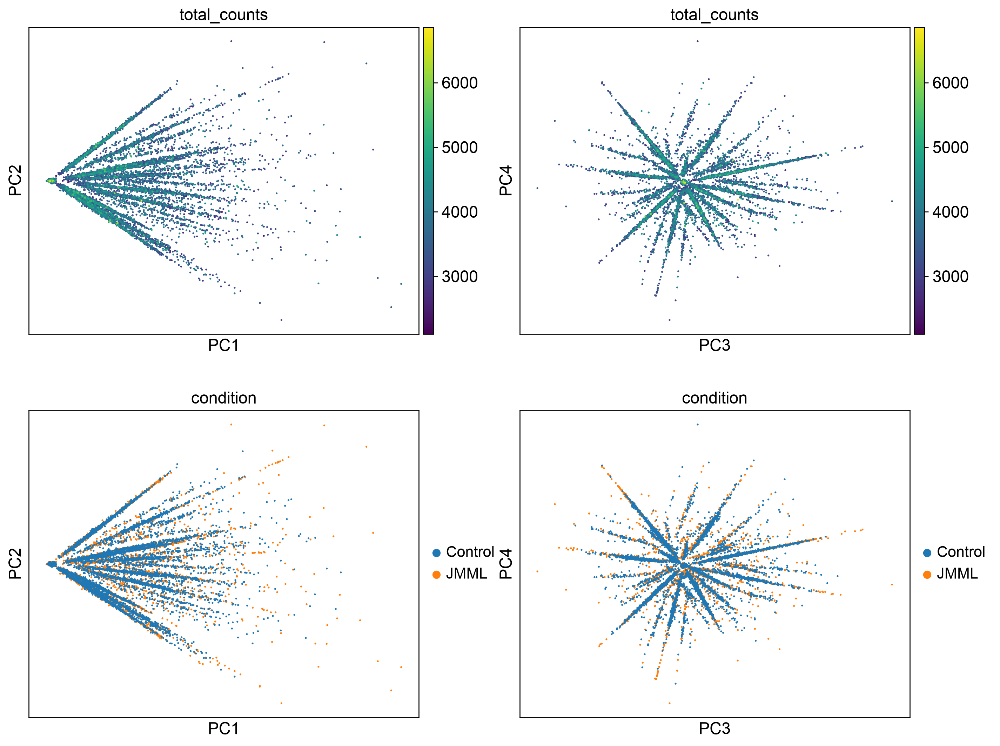

In [13]:
sc.pl.pca(
    adata_hvg,
    color=["total_counts", "total_counts", "condition", "condition"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=10,
)

In [14]:
# Build nearest-neighbors graph using top 30 PCs
sc.pp.neighbors(adata_hvg, n_pcs=30)

# Run Leiden clustering at a clean resolution (e.g., 0.15 for broad clusters)
sc.tl.leiden(adata_hvg, resolution=0.15)

computing neighbors
    using 'X_pca' with n_pcs = 30


/Users/alexchen/anaconda3/envs/jmml_transcriptomics/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


In [15]:
# Proportional representation of each sample across clusters
cluster_proportions = pd.crosstab(
    adata_hvg.obs["sample_id"],
    adata_hvg.obs["leiden"],
    normalize="index",
)

# Display as rounded percentages
print((cluster_proportions * 100).round(2))

leiden                   0      1      2      3      4     5     6     7  \
sample_id                                                                  
GSM3044495_JMML_ID1  30.34  10.14   8.63   8.34   9.13  2.59  2.23  1.65   
GSM3044497_JMML_ID5  28.40  13.27  10.26  10.39   8.25  6.12  5.65  5.18   
GSM3044498_CB_CB35   31.61  13.36  11.44  10.26   9.02  5.11  4.31  4.22   
GSM3044500_CB_CB37   26.81  11.94  11.13   9.61  10.43  5.43  5.90  6.11   

leiden                  8     9     10    11    12    13    14    15    16  \
sample_id                                                                    
GSM3044495_JMML_ID1  2.59  1.29  12.29  0.86  9.42  0.29  0.14  0.00  0.00   
GSM3044497_JMML_ID5  4.97  2.67   0.36  1.38  0.42  1.14  0.70  0.23  0.27   
GSM3044498_CB_CB35   5.06  2.44   0.60  0.92  0.17  0.75  0.34  0.06  0.11   
GSM3044500_CB_CB37   5.26  3.54   0.30  1.22  0.23  0.99  0.43  0.24  0.16   

leiden                 17    18  
sample_id                        
GSM304

In [16]:
# Re-cluster with lower resolution for cleaner lineage groups
sc.tl.leiden(adata_hvg, resolution=0.15)

# Re-run crosstab to inspect the consolidated main clusters
cluster_proportions = pd.crosstab(
    adata_hvg.obs["sample_id"],
    adata_hvg.obs["leiden"],
    normalize="index",
)
print((cluster_proportions * 100).round(2))

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:13)
leiden                   0      1      2      3      4     5     6     7  \
sample_id                                                                  
GSM3044495_JMML_ID1  30.34  10.14   8.63   8.34   9.13  2.59  2.23  1.65   
GSM3044497_JMML_ID5  28.40  13.27  10.26  10.39   8.25  6.12  5.65  5.18   
GSM3044498_CB_CB35   31.61  13.36  11.44  10.26   9.02  5.11  4.31  4.22   
GSM3044500_CB_CB37   26.81  11.94  11.13   9.61  10.43  5.43  5.90  6.11   

leiden                  8     9     10    11    12    13    14    15    16  \
sample_id                                                                    
GSM3044495_JMML_ID1  2.59  1.29  12.29  0.86  9.42  0.29  0.14  0.00  0.00   
GSM3044497_JMML_ID5  4.97  2.67   0.36  1.38  0.42  1.14  0.70  0.23  0.27   
GSM3044498_CB_CB35   5.06  2.44   0.60  0.92  0.17  0.75  0.34  0.06  0.11   
GSM3044500_CB_CB3

In [17]:
# Compute coarse clusters at resolution 0.15
sc.tl.leiden(adata_hvg, resolution=0.15, key_added="leiden_coarse")

# Check the unique cluster labels created
print("New clusters found:", adata_hvg.obs["leiden_coarse"].unique())

coarse_table = pd.crosstab(
    adata_hvg.obs["sample_id"],
    adata_hvg.obs["leiden_coarse"],
    normalize="index",
)

# Display formatted percentage table
(coarse_table * 100).round(2)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_coarse', the cluster labels (adata.obs, categorical) (0:00:13)
New clusters found: ['0', '1', '4', '3', '12', ..., '18', '14', '17', '16', '15']
Length: 19
Categories (19, object): ['0', '1', '2', '3', ..., '15', '16', '17', '18']


leiden_coarse,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
sample_id,,,,,,,,,,,,,,,,,,,
GSM3044495_JMML_ID1,30.34,10.14,8.63,8.34,9.13,2.59,2.23,1.65,2.59,1.29,12.29,0.86,9.42,0.29,0.14,0.00,0.00,0.00,0.07
GSM3044497_JMML_ID5,28.40,13.27,10.26,10.39,8.25,6.12,5.65,5.18,4.97,2.67,0.36,1.38,0.42,1.14,0.70,0.23,0.27,0.27,0.09
GSM3044498_CB_CB35,31.61,13.36,11.44,10.26,9.02,5.11,4.31,4.22,5.06,2.44,0.60,0.92,0.17,0.75,0.34,0.06,0.11,0.11,0.09
GSM3044500_CB_CB37,26.81,11.94,11.13,9.61,10.43,5.43,5.90,6.11,5.26,3.54,0.30,1.22,0.23,0.99,0.43,0.24,0.16,0.16,0.11


In [18]:
# Compute the nearest-neighbor graph using top 30 PCs
sc.pp.neighbors(adata_hvg, n_pcs=30)

# Compute the 2D UMAP layout (this adds 'X_umap' to .obsm)
sc.tl.umap(adata_hvg)

# Compute coarse Leiden clusters
sc.tl.leiden(adata_hvg, resolution=0.15, key_added="leiden_coarse")

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:13)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_coarse', the cluster labels (adata.obs, categorical) (0:00:12)


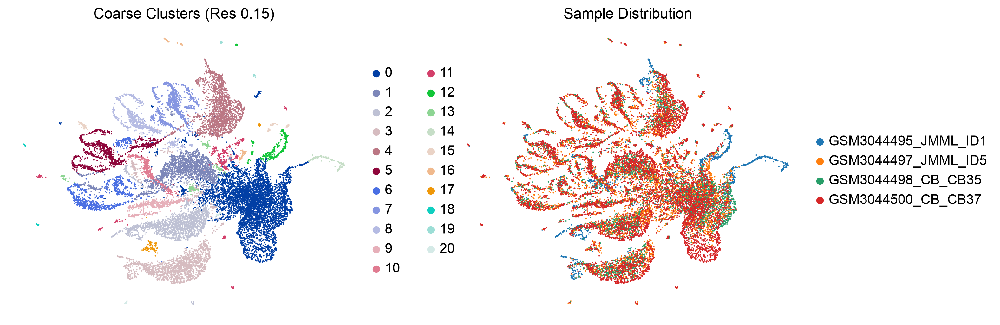

In [19]:
sc.pl.umap(
    adata_hvg,
    color=["leiden_coarse", "sample_id"],
    legend_loc="right margin",
    frameon=False,
    title=["Coarse Clusters (Res 0.15)", "Sample Distribution"],
)

2026-07-31 11:26:26,490 - harmonypy - INFO - Running Harmony
2026-07-31 11:26:26,491 - harmonypy - INFO -   Parameters:
2026-07-31 11:26:26,491 - harmonypy - INFO -     max_iter_harmony: 10
2026-07-31 11:26:26,492 - harmonypy - INFO -     max_iter_kmeans: 4
2026-07-31 11:26:26,492 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-07-31 11:26:26,492 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-07-31 11:26:26,492 - harmonypy - INFO -     nclust: 100
2026-07-31 11:26:26,493 - harmonypy - INFO -     block_size: 0.05
2026-07-31 11:26:26,493 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-07-31 11:26:26,493 - harmonypy - INFO -     theta: [2. 2. 2. 2.]
2026-07-31 11:26:26,494 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-07-31 11:26:26,494 - harmonypy - INFO -     verbose: True
2026-07-31 11:26:26,494 - harmonypy - INFO -     random_state: 0
2026-07-31 11:26:26,495 - harmonypy - INFO -   Data: 50 PCs × 17547 cells
2026-07-31 11:26:26,495 - harmonypy - INFO -

Corrected PCs shape: (17547, 50)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:15)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden_harmony', the cluster labels (adata.obs, categorical) (0:00:13)


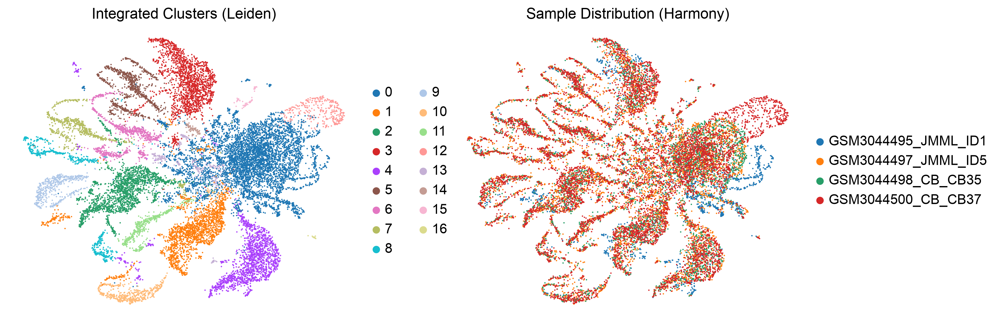

In [20]:
# Run Harmony
ho = hm.run_harmony(adata_hvg.obsm["X_pca"], adata_hvg.obs, "sample_id")

# Convert to numpy array and transpose to (n_cells, n_pcs) -> (17547, 50)
corrected_pcs = np.asarray(ho.Z_corr).T
corrected_pcs = corrected_pcs.T

# Sanity check: confirm the shape is (17547, 50)
print("Corrected PCs shape:", corrected_pcs.shape)

# Assign to AnnData
adata_hvg.obsm["X_pca_harmony"] = corrected_pcs

# Re-compute nearest neighbors using corrected Harmony embedding
sc.pp.neighbors(adata_hvg, use_rep="X_pca_harmony", n_pcs=30)

# Re-compute UMAP
sc.tl.umap(adata_hvg)

# Re-run Leiden clustering
sc.tl.leiden(adata_hvg, resolution=0.2, key_added="leiden_harmony")

# Plot integrated UMAP
sc.pl.umap(
    adata_hvg,
    color=["leiden_harmony", "sample_id"],
    legend_loc="right margin",
    frameon=False,
    title=["Integrated Clusters (Leiden)", "Sample Distribution (Harmony)"],
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_harmony']`


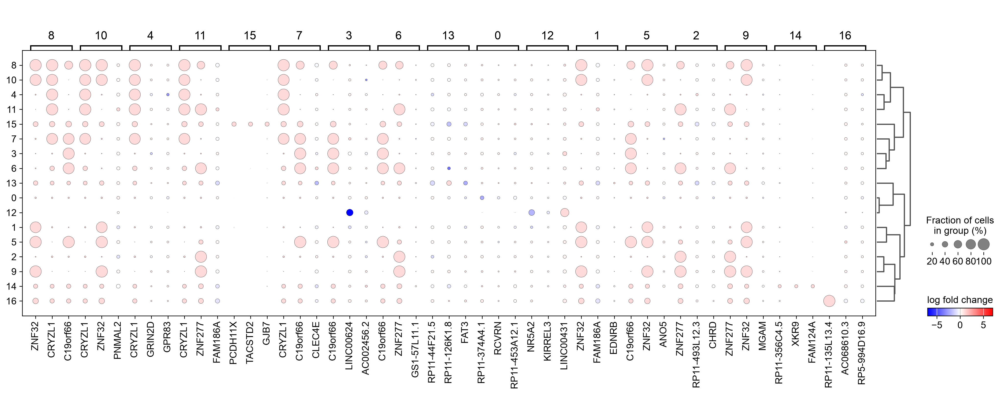

In [21]:
# Post batch effect correction
warnings.filterwarnings("ignore")

# Compute differential expression across Harmony clusters
sc.tl.rank_genes_groups(adata_hvg, groupby="leiden_harmony", method="wilcoxon")

# Plot top 3 marker genes per cluster to annotate lineages
sc.pl.rank_genes_groups_dotplot(
    adata_hvg,
    groupby="leiden_harmony",
    n_genes=3,
    values_to_plot="logfoldchanges",
    cmap="bwr",
    vmax=7,
    vmin=-7,
)

In [22]:
adata_hvg.var_names

Index(['FAM87B', 'RP11-54O7.3', 'C1orf170', 'RP11-54O7.18', 'TAS1R3', 'MXRA8',
       'ANKRD65', 'RP11-345P4.7', 'CALML6', 'RP11-547D24.3',
       ...
       'AP001053.11', 'DNMT3L', 'LRRC3DN', 'TSPEAR-AS1', 'C21orf90',
       'LL21NC02-1C16.2', 'FTCD', 'AP001468.58', 'AP001469.7', 'ZNF84.1'],
      dtype='object', length=3000)

Found markers in adata_hvg: {'Monocytes / Macrophages': ['CD14'], 'Megakaryocytes': ['PPBP'], 'T / NK Cells': ['NCAM1']}
categories: 0, 1, 2, etc.
var_group_labels: Monocytes / Macrophages, Megakaryocytes, T / NK Cells


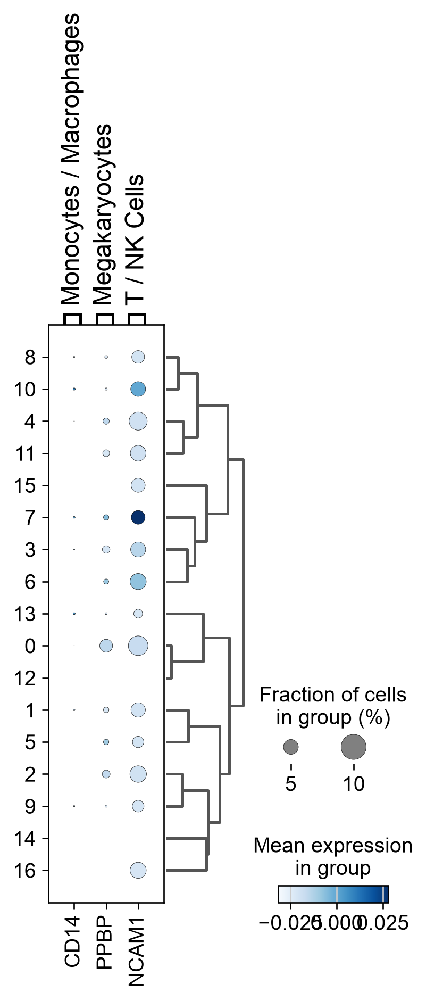

In [23]:
# Dictionary of canonical markers for hematopoiesis and JMML relevance
jmml_lineage_markers = {
    "HSC / Early Progenitor": ["CD34", "AVP", "SPINK2", "CRHBP"],
    "GMP / Myeloid Blast": ["MPO", "ELANE", "CTSG"],
    "Monocytes / Macrophages": ["CD14", "LYZ", "CSF1R", "S100A9"],
    "Erythroid": ["HBA1", "HBB", "GYPA"],
    "Megakaryocytes": ["PPBP", "PF4"],
    "B Cells": ["CD19", "MS4A1"],
    "T / NK Cells": ["CD3D", "NCAM1"],
}

# Filter the dictionary to keep ONLY genes that actually exist in your object
valid_markers = {}
for category, genes in jmml_lineage_markers.items():
    # Keep gene if it's in adata_hvg.var_names
    present_genes = [g for g in genes if g in adata_hvg.var_names]
    if present_genes:
        valid_markers[category] = present_genes

# Check which genes were found
print("Found markers in adata_hvg:", valid_markers)

# Plot with the filtered dictionary
if valid_markers:
    sc.pl.dotplot(
        adata_hvg,
        var_names=valid_markers,
        groupby="leiden_harmony",
        dendrogram=True,
        cmap="Blues",
    )
else:
    print("None of these gene symbols were found directly in var_names!")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_harmony']`
categories: 0, 1, 2, etc.
var_group_labels: HSC / Early Progenitor, GMP / Myeloid Blast, Monocytes / Macrophages, etc.


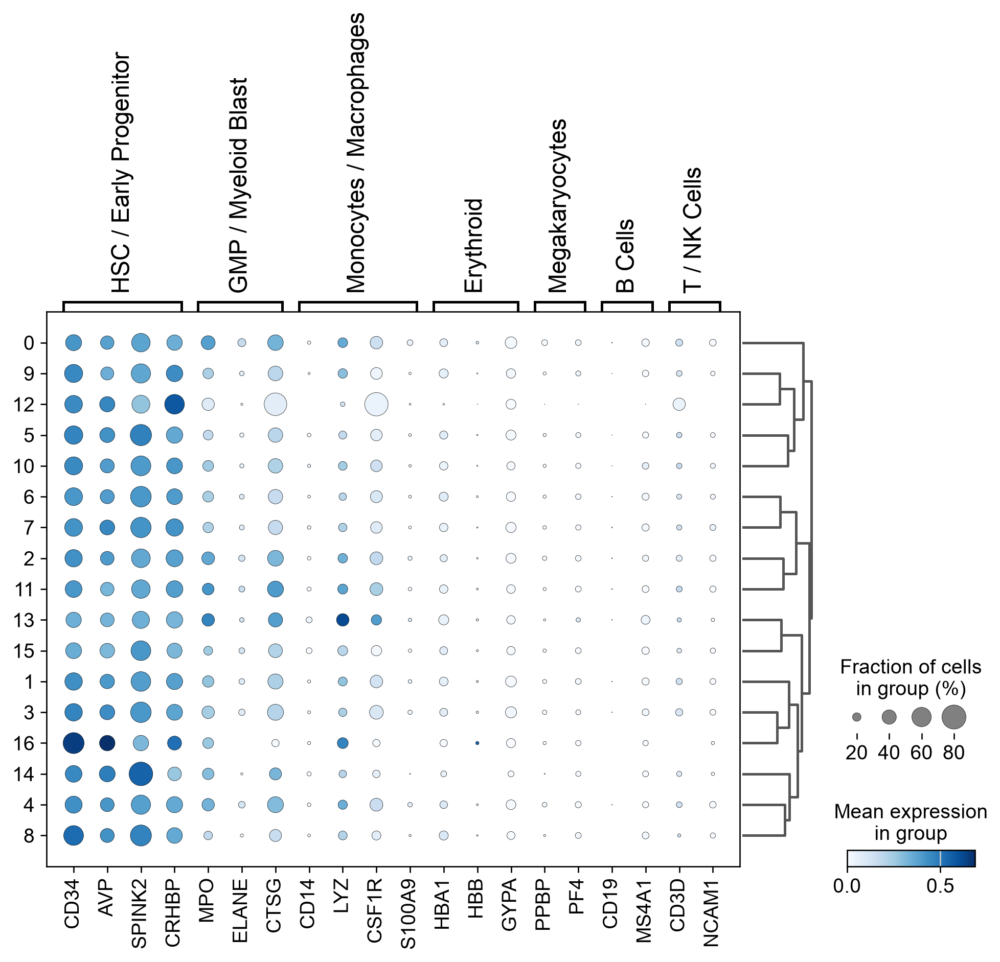

In [24]:
# Copy the Harmony Leiden clusters over to your main AnnData object
adata.obs["leiden_harmony"] = adata_hvg.obs["leiden_harmony"]

# Plot the full dictionary on `adata` (which still has all ~20k+ genes!)
sc.pl.dotplot(
    adata,
    var_names=jmml_lineage_markers,
    groupby="leiden_harmony",
    dendrogram=True,
    cmap="Blues",
)

categories: 0, 1, 2, etc.
var_group_labels: HSC / MPP, GMP / Myeloid Progenitor, Monocytic Progenitor, etc.


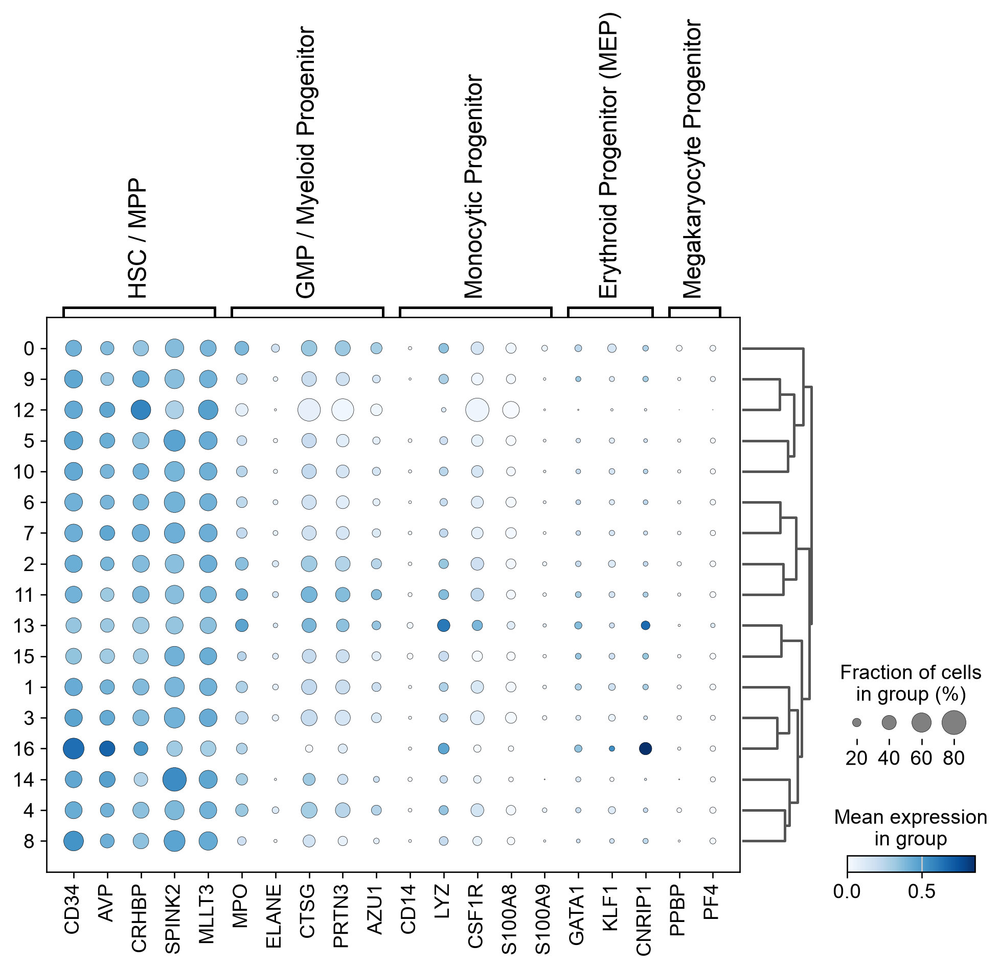

In [25]:
hspc_substate_markers = {
    "HSC / MPP": ["CD34", "AVP", "CRHBP", "SPINK2", "MLLT3"],
    "GMP / Myeloid Progenitor": ["MPO", "ELANE", "CTSG", "PRTN3", "AZU1"],
    "Monocytic Progenitor": ["CD14", "LYZ", "CSF1R", "S100A8", "S100A9"],
    "Erythroid Progenitor (MEP)": ["GATA1", "KLF1", "CNRIP1"],
    "Megakaryocyte Progenitor": ["PPBP", "PF4"]
}

# Filter markers against adata.var_names
valid_hspc_markers = {
    cat: [g for g in genes if g in adata.var_names]
    for cat, genes in hspc_substate_markers.items()
}

# Plot on the full adata object
sc.pl.dotplot(
    adata,
    var_names=valid_hspc_markers,
    groupby="leiden_harmony",
    dendrogram=True,
    cmap="Blues"
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:50)


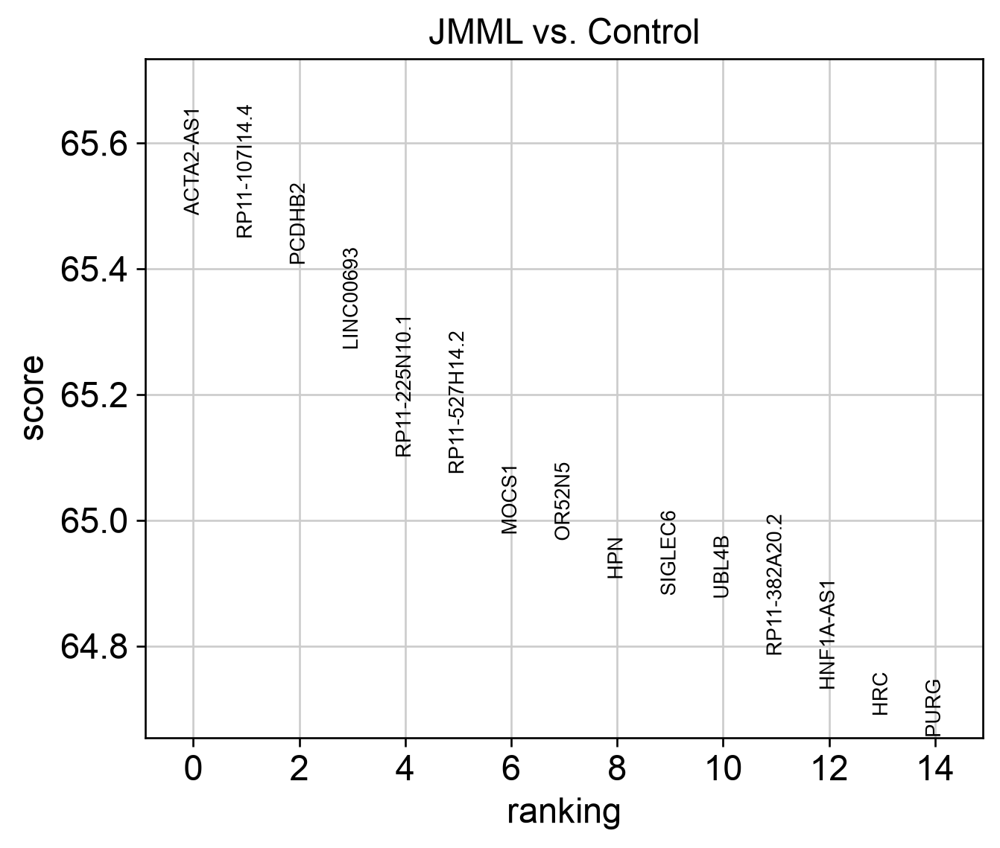

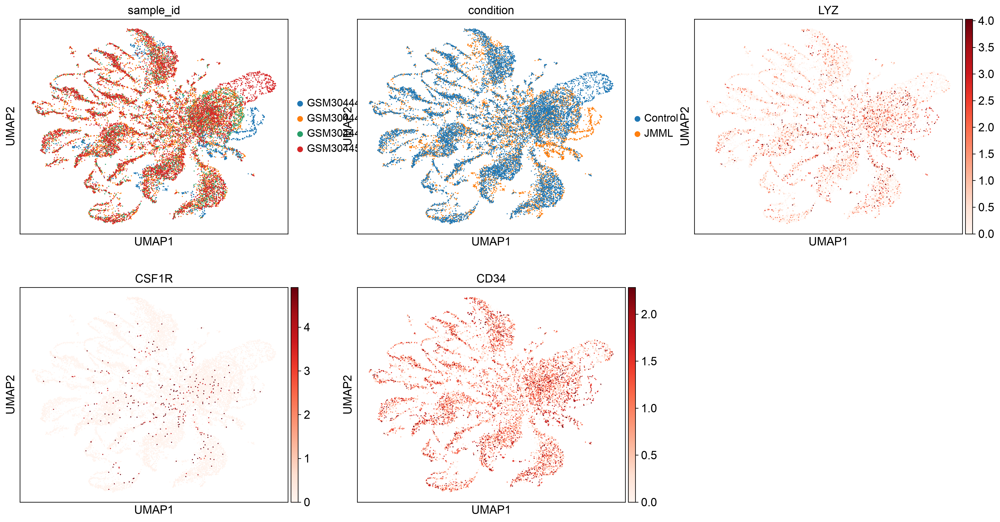

In [33]:
# Feature plot of key monocytic drivers
adata.obsm["X_umap"] = adata_hvg.obsm["X_umap"]
color_vars = [var for var in ["sample_id", "condition", "LYZ", "CSF1R", "CD34"] if var in adata.obs.columns or var in adata.var_names]

# Run differential expression specifically between Control and JMML
sc.tl.rank_genes_groups(adata, groupby="condition", reference="Control", method="wilcoxon")

# Plot top 10 genes up-regulated in JMML vs Control
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

# Fix the color scale on LYZ / CSF1R and plot with top JMML markers
# Clipping vmax at 3 or the 99th percentile makes real expression visible!
top_jmml_genes = list(adata.uns['rank_genes_groups']['names']['JMML'][:3])

sc.pl.umap(
    adata, 
    color=["sample_id", "condition", "LYZ", "CSF1R", "CD34"], 
    ncols=3,
    color_map="Reds",
    vmax='p99'
)

In [28]:
cluster_composition = pd.crosstab(
    adata.obs['leiden_harmony'], 
    adata.obs['sample_id'], 
    normalize='index'
) * 100

print(cluster_composition)

sample_id       GSM3044495_JMML_ID1  GSM3044497_JMML_ID5  GSM3044498_CB_CB35  \
leiden_harmony                                                                 
0                         13.354873            30.533118           21.450368   
1                          6.485912            28.335991           21.212121   
2                          6.367663            32.115172           20.598007   
3                          7.638073            27.497062           18.507638   
4                          6.904906            31.011508           22.410660   
5                          3.106332            32.258065           16.845878   
6                          2.119205            29.536424           16.953642   
7                          4.669887            27.053140           21.256039   
8                          2.767528            35.239852           17.896679   
9                          3.232323            28.080808           17.171717   
10                         4.140787     

In [34]:
condition_composition = pd.crosstab(
    adata.obs["leiden_harmony"], 
    adata.obs["condition"], 
    normalize="index"
) * 100

print(condition_composition.round(2))

condition       Control   JMML
leiden_harmony                
0                 56.11  43.89
1                 65.18  34.82
2                 61.52  38.48
3                 64.86  35.14
4                 62.08  37.92
5                 64.64  35.36
6                 68.34  31.66
7                 68.28  31.72
8                 61.99  38.01
9                 68.69  31.31
10                63.15  36.85
11                62.58  37.42
12               100.00   0.00
13                54.80  45.20
14                43.68  56.32
15                60.00  40.00
16                66.67  33.33


In [35]:
# Extract differential expression results for JMML vs Control
result = adata.uns["rank_genes_groups"]
jmml_genes = result["names"]["JMML"]
jmml_scores = result["scores"]["JMML"]
jmml_logfc = result["logfoldchanges"]["JMML"]

# Create DataFrame
de_df = pd.DataFrame(
    {"gene": jmml_genes, "score": jmml_scores, "log2FC": jmml_logfc}
)

# Filter out non-coding/clone prefixes
pattern = r"^(RP[0-9]|AC[0-9]|AL[0-9]|CTC-|LINC|MIR|CTD-|AF[0-9]|-AS[0-9]|\w+-AS)"
clean_de_df = de_df[~de_df["gene"].str.contains(pattern, regex=True)].head(15)

print("--- Top Protein-Coding Genes Upregulated in JMML ---")
print(clean_de_df.to_string(index=False))

--- Top Protein-Coding Genes Upregulated in JMML ---
   gene     score    log2FC
 PCDHB2 65.405746 -0.914014
  MOCS1 64.976753 -3.040256
 OR52N5 64.967049  0.555780
    HPN 64.905563 -2.695785
SIGLEC6 64.879799  0.768500
  UBL4B 64.874626 -0.010022
    HRC 64.688133  0.374436
   PURG 64.654305 -1.992996
  DYDC1 64.653801 -0.236699
 LILRA6 64.547073 -0.566664
  SFTPD 63.835430 -1.806195
C9orf47 63.713211  0.259096
 GDF5OS 63.428818  0.036057
 IGFALS 63.356800  0.760733
 SLC51B 63.352558 -0.420103
